# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

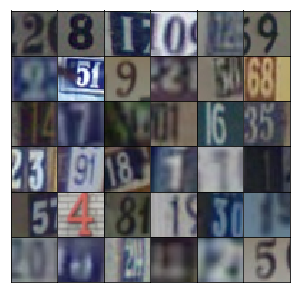

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [28]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
    
    def num_batches(self, batch_size):
        return len(self.train_y)//batch_size
    
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), self.scaler(y)

## Network Inputs

Here, just creating some placeholders like normal.

In [29]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [30]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        zshape = z.get_shape().as_list()
        # First fully connected layer
        x = tf.layers.dense(z, 4*4*512, activation=None, use_bias=False)
        # Reshape to start deconvo stack.
        x = tf.reshape(x, [-1, 4, 4, 512])
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        # now is 4x4x512
        
        x = tf.layers.conv2d_transpose(x, 256, 5, strides=2, padding="SAME", use_bias=False)
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        # now is 8x8x256
        
        x = tf.layers.conv2d_transpose(x, 128, 5, strides=2, padding="SAME", use_bias=False)
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        # now is 16x16x128
        
        # Output layer, 32x32x3
        logits = tf.layers.conv2d_transpose(x, output_dim, 5, strides=2, padding="SAME", use_bias=False)
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [31]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x = tf.layers.conv2d(x, 64, 5, strides=2, padding="SAME", use_bias=False)
        x = tf.maximum(alpha*x, x)
        # now is 16x16x64

        x = tf.layers.conv2d(x, 128, 5, strides=2, padding="SAME", use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha*x, x)
        # now is 8x8x128

        x = tf.layers.conv2d(x, 256, 5, strides=2, padding="SAME", use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha*x, x)
        # now is 4x4x256

        # flat
        x = tf.reshape(x, [-1, 4*4*256])
        
        # output.
        logits = tf.layers.dense(x, 1, use_bias=False)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [32]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Again, nothing new here.

In [33]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [34]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, 0.5)

Here is a function for displaying generated images.

In [25]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img)
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network.

In [38]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(50, z_size))

    samples, losses = [], []
    steps = 0

    n_batches = dataset.num_batches(batch_size)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for i, (x, y) in enumerate(dataset.batches(batch_size)):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{} Batch {}/{}...".format(e+1, epochs, i+1, n_batches),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 5, 10, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very senstive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [39]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002 # 0.001  # paper: 0.0002
batch_size = 128 # 64     # paper: 128
epochs = 25
alpha = 0.2 # 0.01  # paper: 0.2
beta1 = 0.5 # 0.9   # paper: 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25 Batch 50/572... Discriminator Loss: 0.1435... Generator Loss: 2.8743
Epoch 1/25 Batch 100/572... Discriminator Loss: 1.2132... Generator Loss: 0.6083
Epoch 1/25 Batch 150/572... Discriminator Loss: 0.7223... Generator Loss: 1.0173
Epoch 1/25 Batch 200/572... Discriminator Loss: 0.5881... Generator Loss: 1.5716
Epoch 1/25 Batch 250/572... Discriminator Loss: 0.7260... Generator Loss: 1.1474
Epoch 1/25 Batch 300/572... Discriminator Loss: 1.3317... Generator Loss: 2.6976


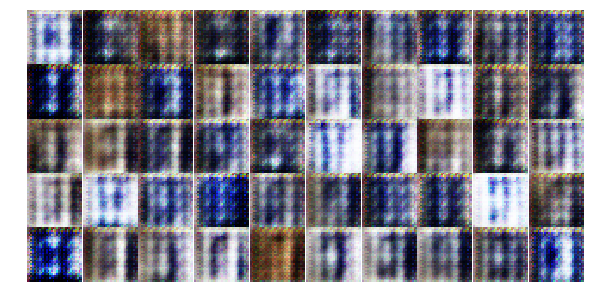

Epoch 1/25 Batch 350/572... Discriminator Loss: 0.7910... Generator Loss: 1.1372
Epoch 1/25 Batch 400/572... Discriminator Loss: 0.8173... Generator Loss: 1.5952
Epoch 1/25 Batch 450/572... Discriminator Loss: 0.5228... Generator Loss: 1.3420
Epoch 1/25 Batch 500/572... Discriminator Loss: 0.6731... Generator Loss: 1.9125
Epoch 1/25 Batch 550/572... Discriminator Loss: 1.0000... Generator Loss: 0.7858
Epoch 2/25 Batch 27/572... Discriminator Loss: 0.6783... Generator Loss: 2.0509


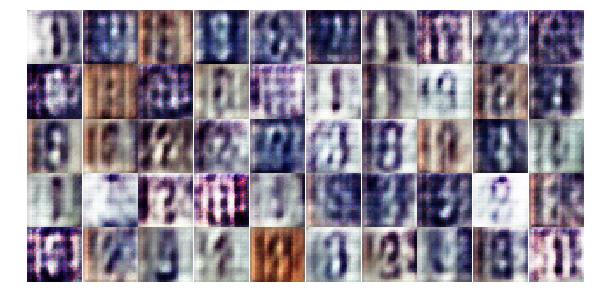

Epoch 2/25 Batch 77/572... Discriminator Loss: 2.0034... Generator Loss: 0.2684
Epoch 2/25 Batch 127/572... Discriminator Loss: 1.0252... Generator Loss: 1.6079
Epoch 2/25 Batch 177/572... Discriminator Loss: 0.8345... Generator Loss: 1.1311
Epoch 2/25 Batch 227/572... Discriminator Loss: 1.4867... Generator Loss: 0.3959
Epoch 2/25 Batch 277/572... Discriminator Loss: 1.0170... Generator Loss: 0.7037
Epoch 2/25 Batch 327/572... Discriminator Loss: 1.1379... Generator Loss: 0.6172


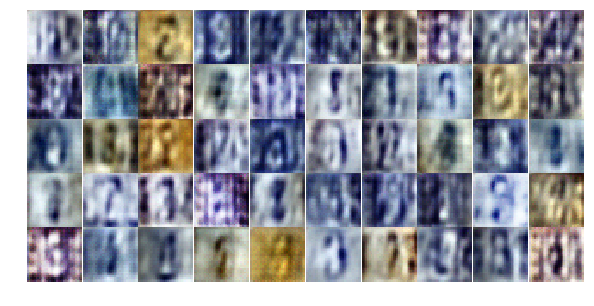

Epoch 2/25 Batch 377/572... Discriminator Loss: 1.0550... Generator Loss: 0.9727
Epoch 2/25 Batch 427/572... Discriminator Loss: 1.2195... Generator Loss: 0.6232
Epoch 2/25 Batch 477/572... Discriminator Loss: 1.0731... Generator Loss: 0.7808
Epoch 2/25 Batch 527/572... Discriminator Loss: 0.8775... Generator Loss: 1.2259
Epoch 3/25 Batch 4/572... Discriminator Loss: 0.9975... Generator Loss: 1.3918
Epoch 3/25 Batch 54/572... Discriminator Loss: 1.7108... Generator Loss: 0.3712


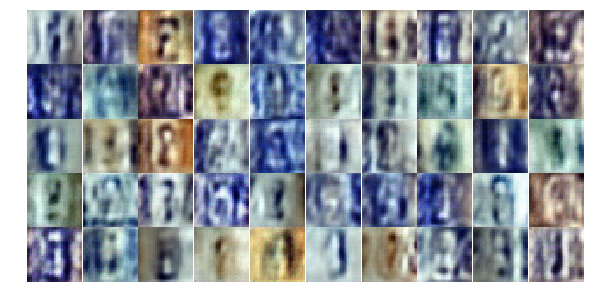

Epoch 3/25 Batch 104/572... Discriminator Loss: 0.8127... Generator Loss: 1.6882
Epoch 3/25 Batch 154/572... Discriminator Loss: 1.1804... Generator Loss: 0.5683
Epoch 3/25 Batch 204/572... Discriminator Loss: 1.0266... Generator Loss: 1.7916
Epoch 3/25 Batch 254/572... Discriminator Loss: 0.6139... Generator Loss: 1.4748
Epoch 3/25 Batch 304/572... Discriminator Loss: 0.7277... Generator Loss: 1.5442
Epoch 3/25 Batch 354/572... Discriminator Loss: 0.6010... Generator Loss: 1.2119


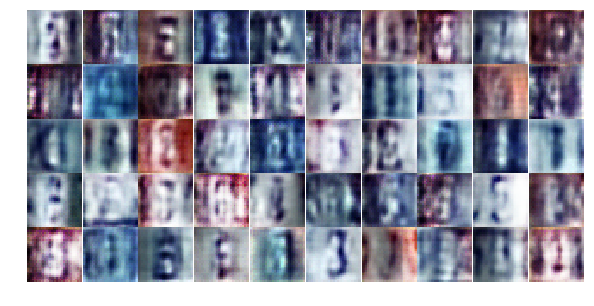

Epoch 3/25 Batch 404/572... Discriminator Loss: 0.7556... Generator Loss: 1.4703
Epoch 3/25 Batch 454/572... Discriminator Loss: 0.7255... Generator Loss: 1.8500
Epoch 3/25 Batch 504/572... Discriminator Loss: 0.4066... Generator Loss: 1.7989
Epoch 3/25 Batch 554/572... Discriminator Loss: 0.6028... Generator Loss: 1.3021
Epoch 4/25 Batch 31/572... Discriminator Loss: 0.5856... Generator Loss: 1.2061
Epoch 4/25 Batch 81/572... Discriminator Loss: 0.7383... Generator Loss: 0.9537


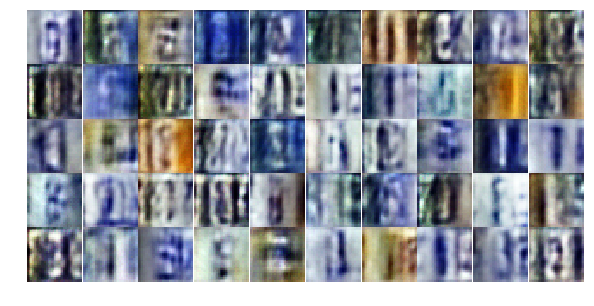

Epoch 4/25 Batch 131/572... Discriminator Loss: 0.8998... Generator Loss: 1.1672
Epoch 4/25 Batch 181/572... Discriminator Loss: 0.8720... Generator Loss: 1.7910
Epoch 4/25 Batch 231/572... Discriminator Loss: 0.5984... Generator Loss: 1.2867
Epoch 4/25 Batch 281/572... Discriminator Loss: 0.4488... Generator Loss: 2.1053
Epoch 4/25 Batch 331/572... Discriminator Loss: 0.3734... Generator Loss: 2.5416
Epoch 4/25 Batch 381/572... Discriminator Loss: 0.7865... Generator Loss: 1.8183


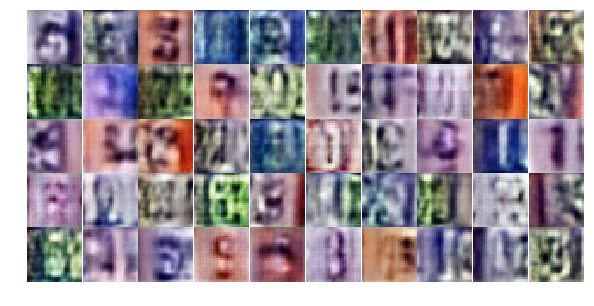

Epoch 4/25 Batch 431/572... Discriminator Loss: 0.3598... Generator Loss: 1.9649
Epoch 4/25 Batch 481/572... Discriminator Loss: 0.8129... Generator Loss: 1.4957
Epoch 4/25 Batch 531/572... Discriminator Loss: 0.6946... Generator Loss: 1.1749
Epoch 5/25 Batch 8/572... Discriminator Loss: 1.3141... Generator Loss: 3.4734
Epoch 5/25 Batch 58/572... Discriminator Loss: 1.5993... Generator Loss: 2.7784
Epoch 5/25 Batch 108/572... Discriminator Loss: 0.8631... Generator Loss: 0.8236


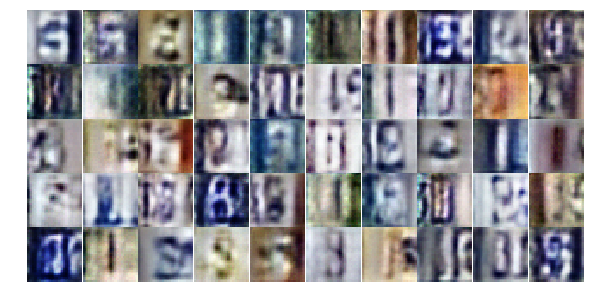

Epoch 5/25 Batch 158/572... Discriminator Loss: 0.7383... Generator Loss: 1.5026
Epoch 5/25 Batch 208/572... Discriminator Loss: 0.4926... Generator Loss: 1.7584
Epoch 5/25 Batch 258/572... Discriminator Loss: 0.6910... Generator Loss: 0.9681
Epoch 5/25 Batch 308/572... Discriminator Loss: 0.3513... Generator Loss: 1.7980
Epoch 5/25 Batch 358/572... Discriminator Loss: 0.5993... Generator Loss: 1.7988
Epoch 5/25 Batch 408/572... Discriminator Loss: 0.6137... Generator Loss: 1.2011


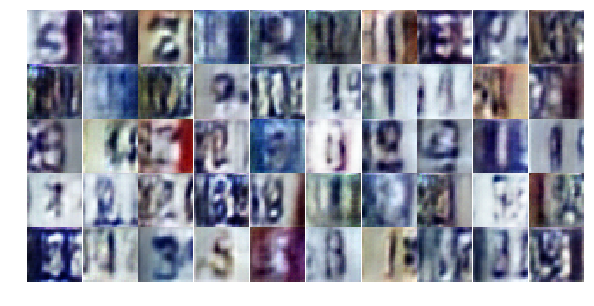

Epoch 5/25 Batch 458/572... Discriminator Loss: 1.7884... Generator Loss: 3.2826
Epoch 5/25 Batch 508/572... Discriminator Loss: 0.9122... Generator Loss: 1.2578
Epoch 5/25 Batch 558/572... Discriminator Loss: 1.0391... Generator Loss: 0.6750
Epoch 6/25 Batch 35/572... Discriminator Loss: 1.0629... Generator Loss: 0.5941
Epoch 6/25 Batch 85/572... Discriminator Loss: 1.0411... Generator Loss: 0.5648
Epoch 6/25 Batch 135/572... Discriminator Loss: 1.0013... Generator Loss: 0.7252


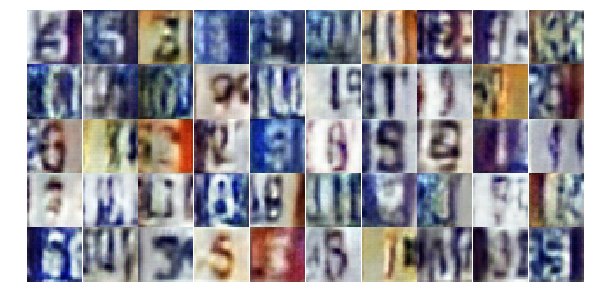

Epoch 6/25 Batch 185/572... Discriminator Loss: 0.5055... Generator Loss: 1.4246
Epoch 6/25 Batch 235/572... Discriminator Loss: 0.8057... Generator Loss: 0.9132
Epoch 6/25 Batch 285/572... Discriminator Loss: 1.1038... Generator Loss: 3.9488
Epoch 6/25 Batch 335/572... Discriminator Loss: 0.9183... Generator Loss: 0.7593
Epoch 6/25 Batch 385/572... Discriminator Loss: 0.7578... Generator Loss: 0.8387
Epoch 6/25 Batch 435/572... Discriminator Loss: 0.3956... Generator Loss: 1.4807


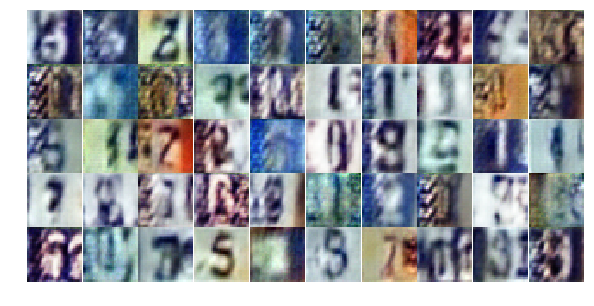

Epoch 6/25 Batch 485/572... Discriminator Loss: 0.6207... Generator Loss: 1.5585
Epoch 6/25 Batch 535/572... Discriminator Loss: 1.6669... Generator Loss: 0.2633
Epoch 7/25 Batch 12/572... Discriminator Loss: 1.2446... Generator Loss: 0.5143
Epoch 7/25 Batch 62/572... Discriminator Loss: 0.9668... Generator Loss: 0.6454
Epoch 7/25 Batch 112/572... Discriminator Loss: 0.5655... Generator Loss: 1.2195
Epoch 7/25 Batch 162/572... Discriminator Loss: 0.5493... Generator Loss: 1.2143


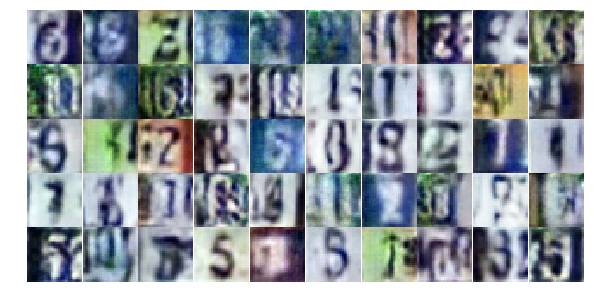

Epoch 7/25 Batch 212/572... Discriminator Loss: 0.5445... Generator Loss: 1.3593
Epoch 7/25 Batch 262/572... Discriminator Loss: 0.6412... Generator Loss: 2.2845
Epoch 7/25 Batch 312/572... Discriminator Loss: 0.5661... Generator Loss: 1.3995
Epoch 7/25 Batch 362/572... Discriminator Loss: 0.5768... Generator Loss: 1.9693
Epoch 7/25 Batch 412/572... Discriminator Loss: 0.6714... Generator Loss: 1.4698
Epoch 7/25 Batch 462/572... Discriminator Loss: 1.2942... Generator Loss: 0.5183


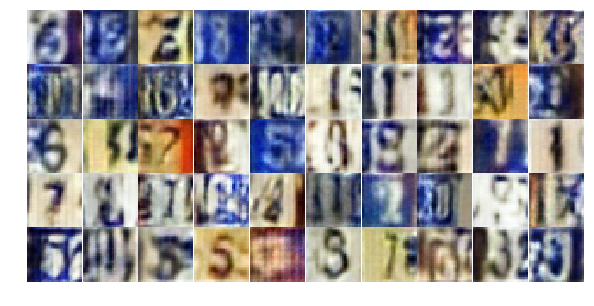

Epoch 7/25 Batch 512/572... Discriminator Loss: 0.5309... Generator Loss: 1.3934
Epoch 7/25 Batch 562/572... Discriminator Loss: 1.1100... Generator Loss: 0.5053
Epoch 8/25 Batch 39/572... Discriminator Loss: 0.6802... Generator Loss: 1.6579
Epoch 8/25 Batch 89/572... Discriminator Loss: 0.6571... Generator Loss: 1.3035
Epoch 8/25 Batch 139/572... Discriminator Loss: 0.8421... Generator Loss: 1.0669
Epoch 8/25 Batch 189/572... Discriminator Loss: 0.8987... Generator Loss: 0.7213


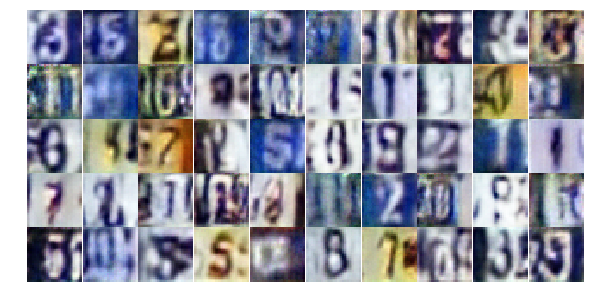

Epoch 8/25 Batch 239/572... Discriminator Loss: 0.3718... Generator Loss: 2.4218
Epoch 8/25 Batch 289/572... Discriminator Loss: 1.1081... Generator Loss: 0.5961
Epoch 8/25 Batch 339/572... Discriminator Loss: 1.3406... Generator Loss: 0.4843
Epoch 8/25 Batch 389/572... Discriminator Loss: 0.5535... Generator Loss: 1.2842
Epoch 8/25 Batch 439/572... Discriminator Loss: 0.8100... Generator Loss: 2.3367
Epoch 8/25 Batch 489/572... Discriminator Loss: 0.8401... Generator Loss: 0.8500


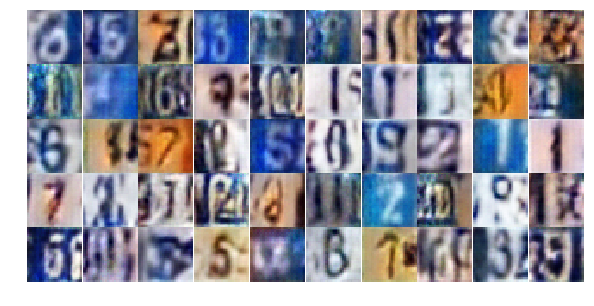

Epoch 8/25 Batch 539/572... Discriminator Loss: 0.5377... Generator Loss: 1.8813
Epoch 9/25 Batch 16/572... Discriminator Loss: 0.8860... Generator Loss: 0.7169
Epoch 9/25 Batch 66/572... Discriminator Loss: 0.7795... Generator Loss: 0.8456
Epoch 9/25 Batch 116/572... Discriminator Loss: 0.5316... Generator Loss: 1.3573
Epoch 9/25 Batch 166/572... Discriminator Loss: 0.5245... Generator Loss: 1.2842
Epoch 9/25 Batch 216/572... Discriminator Loss: 1.3811... Generator Loss: 0.3787


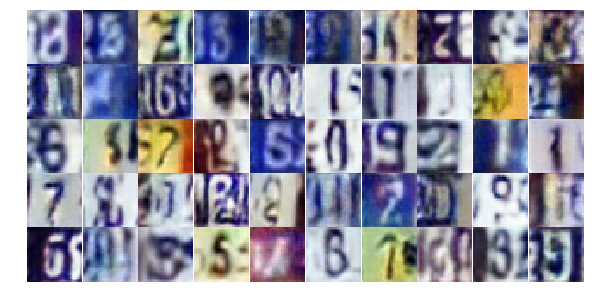

Epoch 9/25 Batch 266/572... Discriminator Loss: 0.4142... Generator Loss: 1.6498
Epoch 9/25 Batch 316/572... Discriminator Loss: 0.6217... Generator Loss: 1.2220
Epoch 9/25 Batch 366/572... Discriminator Loss: 1.2801... Generator Loss: 0.4571
Epoch 9/25 Batch 416/572... Discriminator Loss: 0.5931... Generator Loss: 1.2475
Epoch 9/25 Batch 466/572... Discriminator Loss: 0.4512... Generator Loss: 1.5687
Epoch 9/25 Batch 516/572... Discriminator Loss: 0.5367... Generator Loss: 1.5314


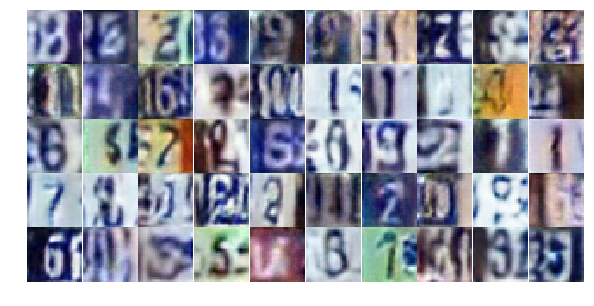

Epoch 9/25 Batch 566/572... Discriminator Loss: 0.7478... Generator Loss: 0.9917
Epoch 10/25 Batch 43/572... Discriminator Loss: 1.3600... Generator Loss: 0.3809
Epoch 10/25 Batch 93/572... Discriminator Loss: 0.5827... Generator Loss: 1.7348
Epoch 10/25 Batch 143/572... Discriminator Loss: 0.6400... Generator Loss: 1.2063
Epoch 10/25 Batch 193/572... Discriminator Loss: 0.9484... Generator Loss: 1.8792
Epoch 10/25 Batch 243/572... Discriminator Loss: 0.4332... Generator Loss: 2.5044


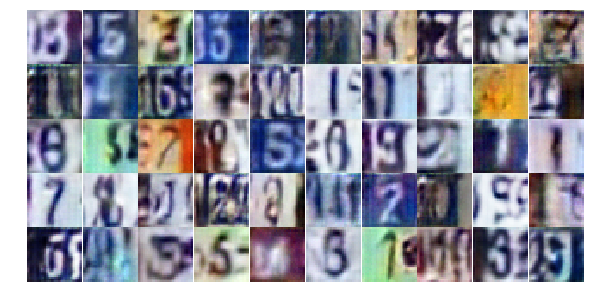

Epoch 10/25 Batch 293/572... Discriminator Loss: 1.2149... Generator Loss: 0.4722
Epoch 10/25 Batch 343/572... Discriminator Loss: 0.7169... Generator Loss: 2.0846
Epoch 10/25 Batch 393/572... Discriminator Loss: 0.6589... Generator Loss: 1.0074
Epoch 10/25 Batch 443/572... Discriminator Loss: 0.8093... Generator Loss: 0.7818
Epoch 10/25 Batch 493/572... Discriminator Loss: 0.3929... Generator Loss: 1.8038
Epoch 10/25 Batch 543/572... Discriminator Loss: 0.5296... Generator Loss: 1.7278


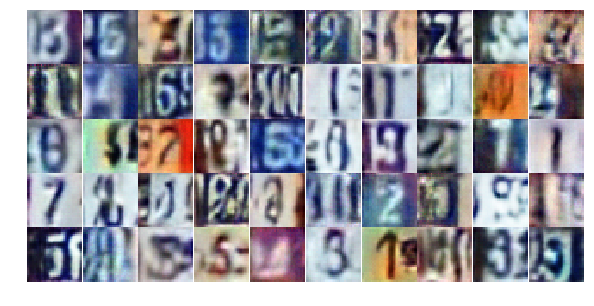

Epoch 11/25 Batch 20/572... Discriminator Loss: 0.7364... Generator Loss: 0.9432
Epoch 11/25 Batch 70/572... Discriminator Loss: 0.4347... Generator Loss: 1.6352
Epoch 11/25 Batch 120/572... Discriminator Loss: 0.8710... Generator Loss: 0.7649
Epoch 11/25 Batch 170/572... Discriminator Loss: 1.3177... Generator Loss: 0.4543
Epoch 11/25 Batch 220/572... Discriminator Loss: 0.4548... Generator Loss: 1.9200
Epoch 11/25 Batch 270/572... Discriminator Loss: 0.9394... Generator Loss: 0.6805


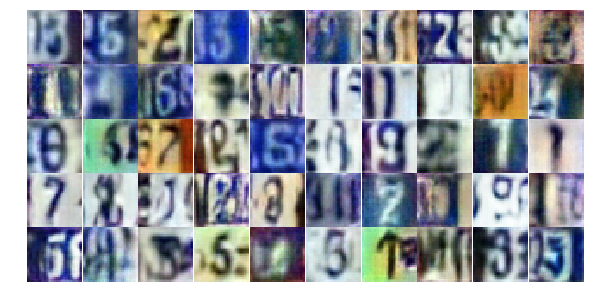

Epoch 11/25 Batch 320/572... Discriminator Loss: 0.7192... Generator Loss: 0.8964
Epoch 11/25 Batch 370/572... Discriminator Loss: 0.7997... Generator Loss: 0.9751
Epoch 11/25 Batch 420/572... Discriminator Loss: 0.5566... Generator Loss: 1.1530
Epoch 11/25 Batch 470/572... Discriminator Loss: 0.6427... Generator Loss: 1.1007
Epoch 11/25 Batch 520/572... Discriminator Loss: 0.8882... Generator Loss: 0.9948
Epoch 11/25 Batch 570/572... Discriminator Loss: 0.9855... Generator Loss: 0.6868


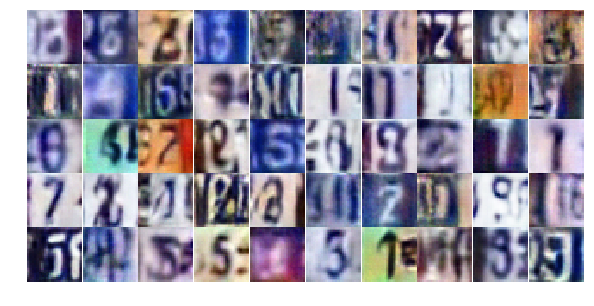

Epoch 12/25 Batch 47/572... Discriminator Loss: 0.4748... Generator Loss: 2.1104
Epoch 12/25 Batch 97/572... Discriminator Loss: 1.2974... Generator Loss: 0.4423
Epoch 12/25 Batch 147/572... Discriminator Loss: 0.5512... Generator Loss: 1.5288
Epoch 12/25 Batch 197/572... Discriminator Loss: 0.9714... Generator Loss: 0.6692
Epoch 12/25 Batch 247/572... Discriminator Loss: 0.5299... Generator Loss: 1.4202
Epoch 12/25 Batch 297/572... Discriminator Loss: 0.5540... Generator Loss: 1.2606


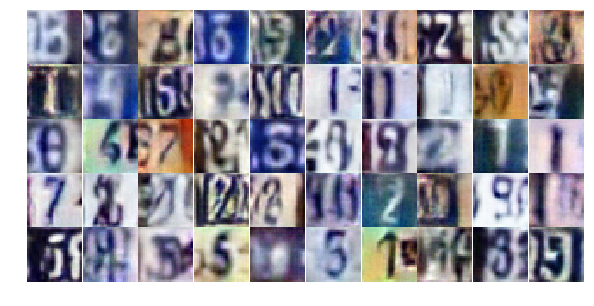

Epoch 12/25 Batch 347/572... Discriminator Loss: 0.7902... Generator Loss: 2.1279
Epoch 12/25 Batch 397/572... Discriminator Loss: 0.3668... Generator Loss: 1.8223
Epoch 12/25 Batch 447/572... Discriminator Loss: 1.4624... Generator Loss: 0.3492
Epoch 12/25 Batch 497/572... Discriminator Loss: 0.6439... Generator Loss: 1.1625
Epoch 12/25 Batch 547/572... Discriminator Loss: 0.7073... Generator Loss: 1.0412
Epoch 13/25 Batch 24/572... Discriminator Loss: 0.6452... Generator Loss: 1.2325


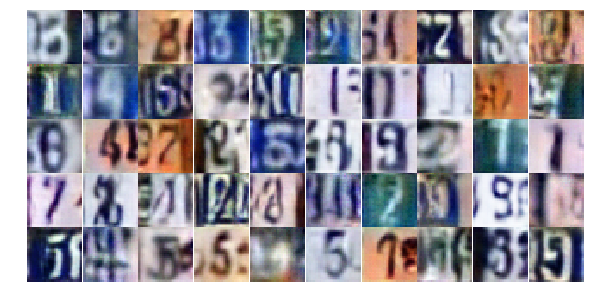

Epoch 13/25 Batch 74/572... Discriminator Loss: 0.7609... Generator Loss: 0.9590
Epoch 13/25 Batch 124/572... Discriminator Loss: 0.5133... Generator Loss: 2.0751
Epoch 13/25 Batch 174/572... Discriminator Loss: 0.6242... Generator Loss: 1.1897
Epoch 13/25 Batch 224/572... Discriminator Loss: 0.8906... Generator Loss: 0.7424
Epoch 13/25 Batch 274/572... Discriminator Loss: 0.8785... Generator Loss: 0.7918
Epoch 13/25 Batch 324/572... Discriminator Loss: 0.5686... Generator Loss: 1.4082


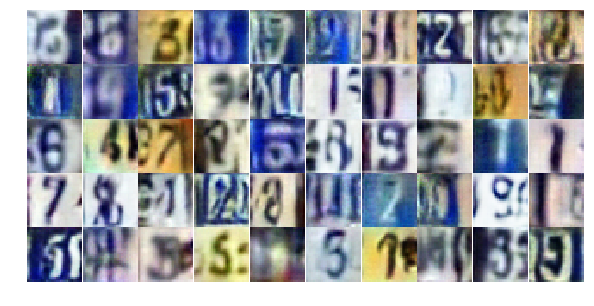

Epoch 13/25 Batch 374/572... Discriminator Loss: 0.7290... Generator Loss: 0.9872
Epoch 13/25 Batch 424/572... Discriminator Loss: 0.5299... Generator Loss: 1.3061
Epoch 13/25 Batch 474/572... Discriminator Loss: 1.1376... Generator Loss: 0.5534
Epoch 13/25 Batch 524/572... Discriminator Loss: 1.3827... Generator Loss: 0.3637
Epoch 14/25 Batch 1/572... Discriminator Loss: 1.0139... Generator Loss: 0.6195
Epoch 14/25 Batch 51/572... Discriminator Loss: 0.7519... Generator Loss: 0.9520


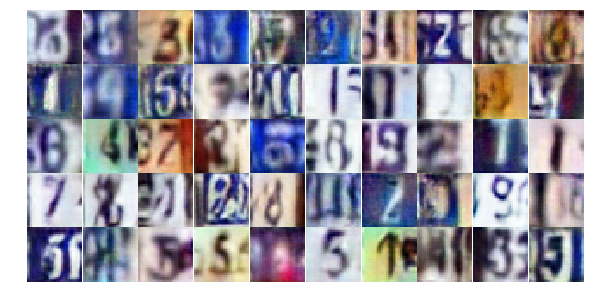

Epoch 14/25 Batch 101/572... Discriminator Loss: 0.9226... Generator Loss: 0.7040
Epoch 14/25 Batch 151/572... Discriminator Loss: 1.8636... Generator Loss: 0.2510
Epoch 14/25 Batch 201/572... Discriminator Loss: 0.6733... Generator Loss: 1.0255
Epoch 14/25 Batch 251/572... Discriminator Loss: 0.5363... Generator Loss: 1.4980
Epoch 14/25 Batch 301/572... Discriminator Loss: 0.6648... Generator Loss: 1.1918
Epoch 14/25 Batch 351/572... Discriminator Loss: 0.8601... Generator Loss: 0.8528


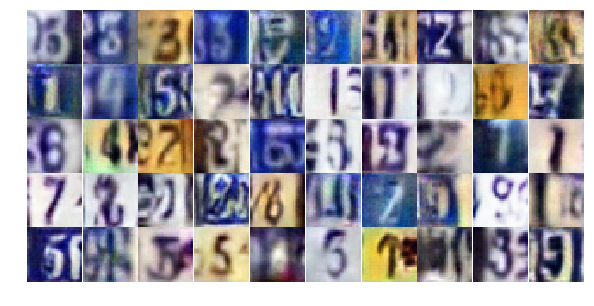

Epoch 14/25 Batch 401/572... Discriminator Loss: 1.4739... Generator Loss: 0.3799
Epoch 14/25 Batch 451/572... Discriminator Loss: 1.0849... Generator Loss: 0.5527
Epoch 14/25 Batch 501/572... Discriminator Loss: 0.6816... Generator Loss: 1.1454
Epoch 14/25 Batch 551/572... Discriminator Loss: 1.8168... Generator Loss: 0.2661
Epoch 15/25 Batch 28/572... Discriminator Loss: 0.4933... Generator Loss: 1.5144
Epoch 15/25 Batch 78/572... Discriminator Loss: 0.7540... Generator Loss: 0.9246


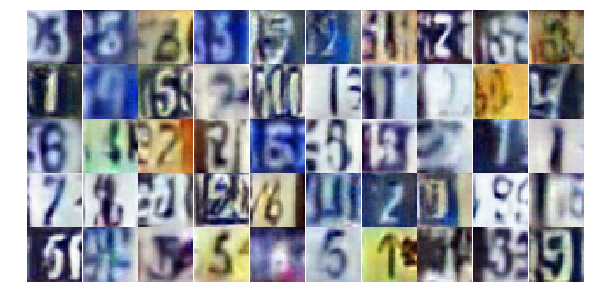

Epoch 15/25 Batch 128/572... Discriminator Loss: 1.9827... Generator Loss: 0.2418
Epoch 15/25 Batch 178/572... Discriminator Loss: 0.9124... Generator Loss: 0.7518
Epoch 15/25 Batch 228/572... Discriminator Loss: 1.1577... Generator Loss: 0.5775
Epoch 15/25 Batch 278/572... Discriminator Loss: 1.4848... Generator Loss: 0.3683
Epoch 15/25 Batch 328/572... Discriminator Loss: 0.6548... Generator Loss: 1.1390
Epoch 15/25 Batch 378/572... Discriminator Loss: 1.1353... Generator Loss: 0.5504


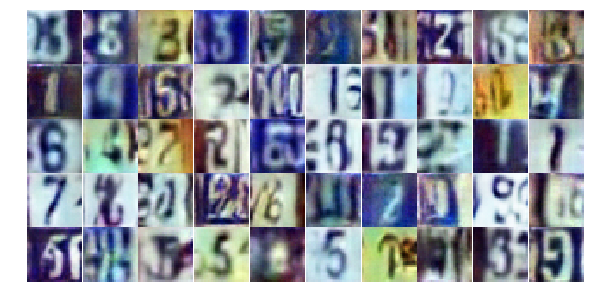

Epoch 15/25 Batch 428/572... Discriminator Loss: 0.5731... Generator Loss: 1.0603
Epoch 15/25 Batch 478/572... Discriminator Loss: 1.0656... Generator Loss: 0.6351
Epoch 15/25 Batch 528/572... Discriminator Loss: 1.0353... Generator Loss: 0.7223
Epoch 16/25 Batch 5/572... Discriminator Loss: 1.2811... Generator Loss: 0.4391
Epoch 16/25 Batch 55/572... Discriminator Loss: 0.7888... Generator Loss: 1.4689
Epoch 16/25 Batch 105/572... Discriminator Loss: 0.5853... Generator Loss: 1.2271


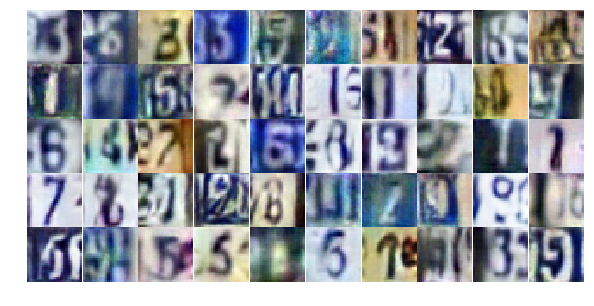

Epoch 16/25 Batch 155/572... Discriminator Loss: 0.5731... Generator Loss: 1.4410
Epoch 16/25 Batch 205/572... Discriminator Loss: 0.5554... Generator Loss: 1.6806
Epoch 16/25 Batch 255/572... Discriminator Loss: 0.8199... Generator Loss: 0.9407
Epoch 16/25 Batch 305/572... Discriminator Loss: 0.6393... Generator Loss: 1.2182
Epoch 16/25 Batch 355/572... Discriminator Loss: 0.8858... Generator Loss: 0.9293
Epoch 16/25 Batch 405/572... Discriminator Loss: 0.6029... Generator Loss: 2.0877


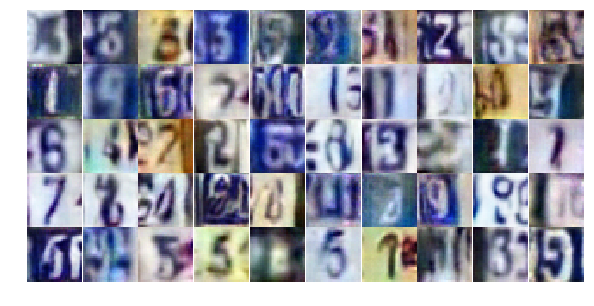

Epoch 16/25 Batch 455/572... Discriminator Loss: 0.6452... Generator Loss: 1.5953
Epoch 16/25 Batch 505/572... Discriminator Loss: 0.7503... Generator Loss: 0.8534
Epoch 16/25 Batch 555/572... Discriminator Loss: 0.4496... Generator Loss: 1.6404
Epoch 17/25 Batch 32/572... Discriminator Loss: 0.9572... Generator Loss: 0.7012
Epoch 17/25 Batch 82/572... Discriminator Loss: 1.1862... Generator Loss: 0.5050
Epoch 17/25 Batch 132/572... Discriminator Loss: 0.6146... Generator Loss: 1.6937


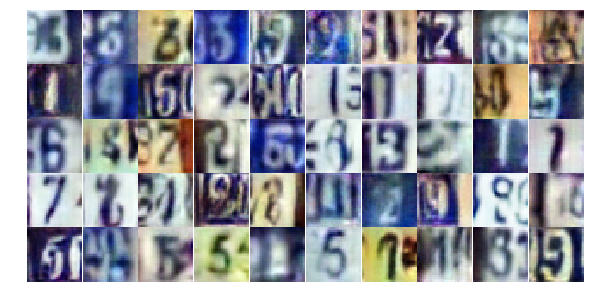

Epoch 17/25 Batch 182/572... Discriminator Loss: 0.7123... Generator Loss: 1.8373
Epoch 17/25 Batch 232/572... Discriminator Loss: 0.7736... Generator Loss: 0.8092
Epoch 17/25 Batch 282/572... Discriminator Loss: 1.3019... Generator Loss: 0.4073
Epoch 17/25 Batch 332/572... Discriminator Loss: 0.5219... Generator Loss: 1.3219
Epoch 17/25 Batch 382/572... Discriminator Loss: 1.1252... Generator Loss: 0.5466
Epoch 17/25 Batch 432/572... Discriminator Loss: 1.0305... Generator Loss: 0.6286


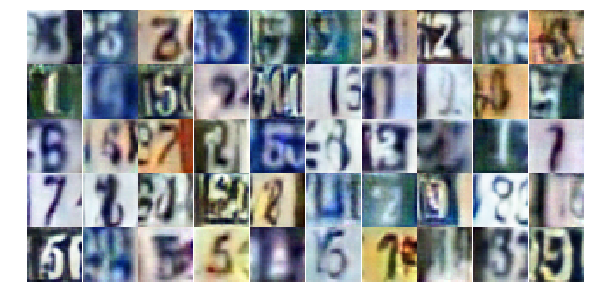

Epoch 17/25 Batch 482/572... Discriminator Loss: 0.9840... Generator Loss: 0.6538
Epoch 17/25 Batch 532/572... Discriminator Loss: 1.4774... Generator Loss: 0.4257
Epoch 18/25 Batch 9/572... Discriminator Loss: 0.7647... Generator Loss: 0.8843
Epoch 18/25 Batch 59/572... Discriminator Loss: 0.7596... Generator Loss: 0.9876
Epoch 18/25 Batch 109/572... Discriminator Loss: 0.5341... Generator Loss: 1.2991
Epoch 18/25 Batch 159/572... Discriminator Loss: 0.2761... Generator Loss: 2.6059


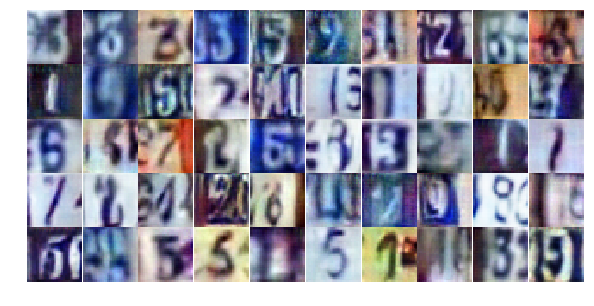

Epoch 18/25 Batch 209/572... Discriminator Loss: 0.7946... Generator Loss: 0.8587
Epoch 18/25 Batch 259/572... Discriminator Loss: 1.4692... Generator Loss: 0.3689
Epoch 18/25 Batch 309/572... Discriminator Loss: 1.1021... Generator Loss: 0.5655
Epoch 18/25 Batch 359/572... Discriminator Loss: 0.7810... Generator Loss: 0.9566
Epoch 18/25 Batch 409/572... Discriminator Loss: 0.7214... Generator Loss: 1.2197
Epoch 18/25 Batch 459/572... Discriminator Loss: 0.5465... Generator Loss: 1.2523


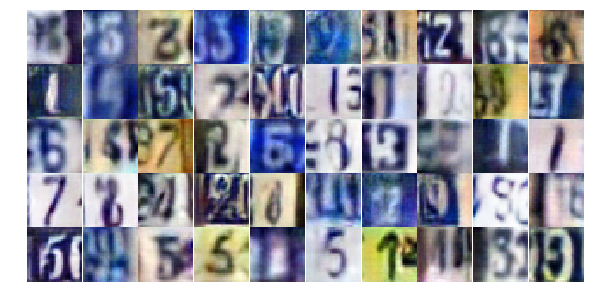

Epoch 18/25 Batch 509/572... Discriminator Loss: 0.6134... Generator Loss: 1.4634
Epoch 18/25 Batch 559/572... Discriminator Loss: 0.7656... Generator Loss: 0.8654
Epoch 19/25 Batch 36/572... Discriminator Loss: 0.6094... Generator Loss: 1.1576
Epoch 19/25 Batch 86/572... Discriminator Loss: 1.0813... Generator Loss: 0.6082
Epoch 19/25 Batch 136/572... Discriminator Loss: 0.8415... Generator Loss: 0.8306
Epoch 19/25 Batch 186/572... Discriminator Loss: 0.9098... Generator Loss: 0.9117


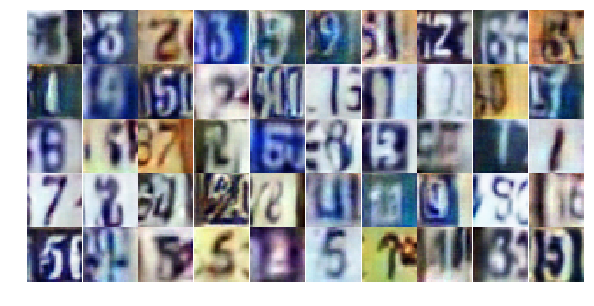

Epoch 19/25 Batch 236/572... Discriminator Loss: 0.8422... Generator Loss: 0.8956
Epoch 19/25 Batch 286/572... Discriminator Loss: 1.2959... Generator Loss: 0.4512
Epoch 19/25 Batch 336/572... Discriminator Loss: 0.6631... Generator Loss: 1.1966
Epoch 19/25 Batch 386/572... Discriminator Loss: 0.5511... Generator Loss: 1.4430
Epoch 19/25 Batch 436/572... Discriminator Loss: 0.8265... Generator Loss: 1.5156
Epoch 19/25 Batch 486/572... Discriminator Loss: 0.5974... Generator Loss: 1.6534


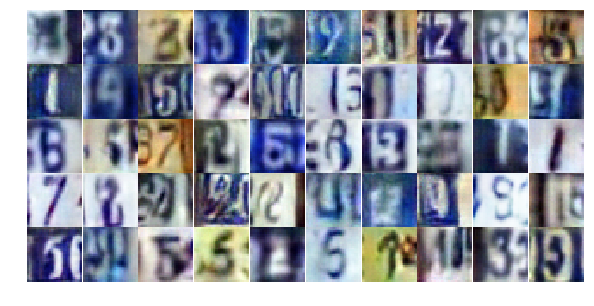

Epoch 19/25 Batch 536/572... Discriminator Loss: 0.6752... Generator Loss: 2.7502
Epoch 20/25 Batch 13/572... Discriminator Loss: 0.9196... Generator Loss: 0.6950
Epoch 20/25 Batch 63/572... Discriminator Loss: 0.7857... Generator Loss: 0.8844
Epoch 20/25 Batch 113/572... Discriminator Loss: 0.7257... Generator Loss: 1.0067
Epoch 20/25 Batch 163/572... Discriminator Loss: 1.0282... Generator Loss: 0.6877
Epoch 20/25 Batch 213/572... Discriminator Loss: 1.0874... Generator Loss: 0.5974


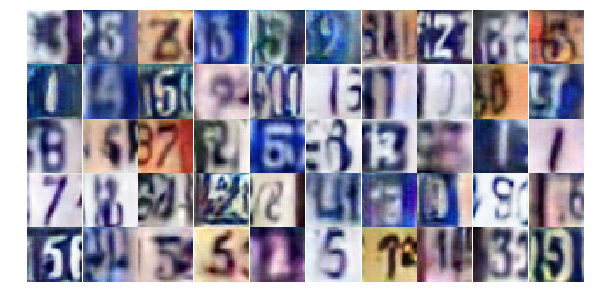

Epoch 20/25 Batch 263/572... Discriminator Loss: 1.0303... Generator Loss: 0.6408
Epoch 20/25 Batch 313/572... Discriminator Loss: 0.5390... Generator Loss: 1.0984
Epoch 20/25 Batch 363/572... Discriminator Loss: 0.9343... Generator Loss: 0.7498
Epoch 20/25 Batch 413/572... Discriminator Loss: 1.1214... Generator Loss: 0.5447
Epoch 20/25 Batch 463/572... Discriminator Loss: 0.8019... Generator Loss: 0.8888
Epoch 20/25 Batch 513/572... Discriminator Loss: 0.7351... Generator Loss: 1.1169


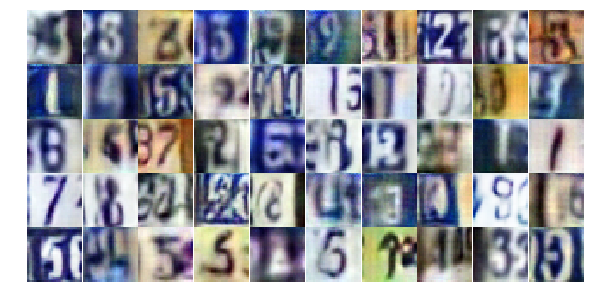

Epoch 20/25 Batch 563/572... Discriminator Loss: 0.6601... Generator Loss: 1.1381
Epoch 21/25 Batch 40/572... Discriminator Loss: 1.2693... Generator Loss: 0.4687
Epoch 21/25 Batch 90/572... Discriminator Loss: 0.8377... Generator Loss: 0.8096
Epoch 21/25 Batch 140/572... Discriminator Loss: 1.0521... Generator Loss: 0.5930
Epoch 21/25 Batch 190/572... Discriminator Loss: 0.9247... Generator Loss: 1.7970
Epoch 21/25 Batch 240/572... Discriminator Loss: 0.8962... Generator Loss: 0.8416


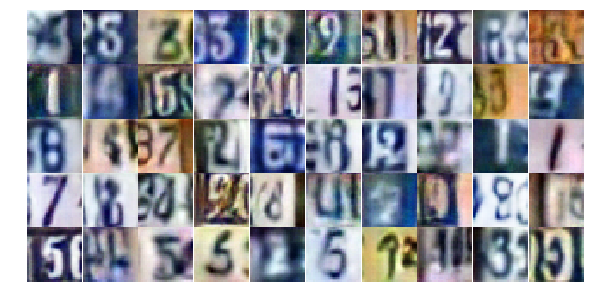

Epoch 21/25 Batch 290/572... Discriminator Loss: 1.2040... Generator Loss: 0.4906
Epoch 21/25 Batch 340/572... Discriminator Loss: 1.2960... Generator Loss: 0.5006
Epoch 21/25 Batch 390/572... Discriminator Loss: 0.4889... Generator Loss: 1.3480
Epoch 21/25 Batch 440/572... Discriminator Loss: 0.6175... Generator Loss: 1.0986
Epoch 21/25 Batch 490/572... Discriminator Loss: 0.4305... Generator Loss: 1.6711
Epoch 21/25 Batch 540/572... Discriminator Loss: 0.5392... Generator Loss: 1.5393


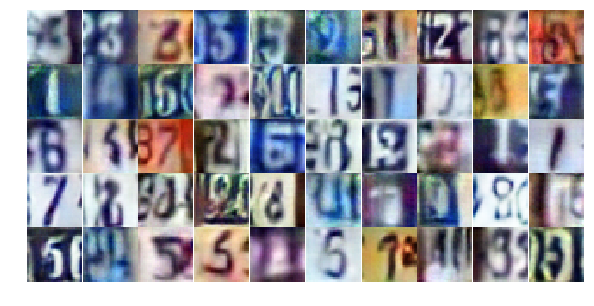

Epoch 22/25 Batch 17/572... Discriminator Loss: 0.9028... Generator Loss: 1.0902
Epoch 22/25 Batch 67/572... Discriminator Loss: 0.9156... Generator Loss: 0.7124
Epoch 22/25 Batch 117/572... Discriminator Loss: 0.7412... Generator Loss: 1.1807
Epoch 22/25 Batch 167/572... Discriminator Loss: 2.0326... Generator Loss: 0.2549
Epoch 22/25 Batch 217/572... Discriminator Loss: 0.5938... Generator Loss: 1.7026
Epoch 22/25 Batch 267/572... Discriminator Loss: 0.7248... Generator Loss: 0.9640


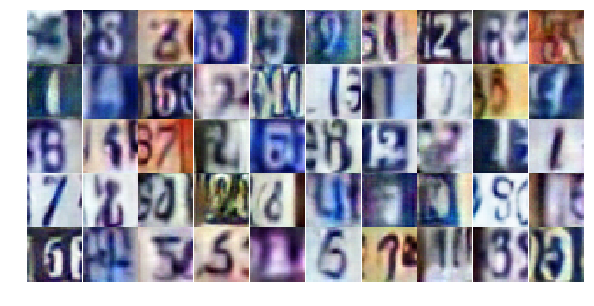

Epoch 22/25 Batch 317/572... Discriminator Loss: 0.8919... Generator Loss: 0.8765
Epoch 22/25 Batch 367/572... Discriminator Loss: 0.9256... Generator Loss: 0.7092
Epoch 22/25 Batch 417/572... Discriminator Loss: 0.5428... Generator Loss: 1.2388
Epoch 22/25 Batch 467/572... Discriminator Loss: 0.5642... Generator Loss: 1.3849
Epoch 22/25 Batch 517/572... Discriminator Loss: 0.5122... Generator Loss: 1.7601
Epoch 22/25 Batch 567/572... Discriminator Loss: 0.9798... Generator Loss: 0.8620


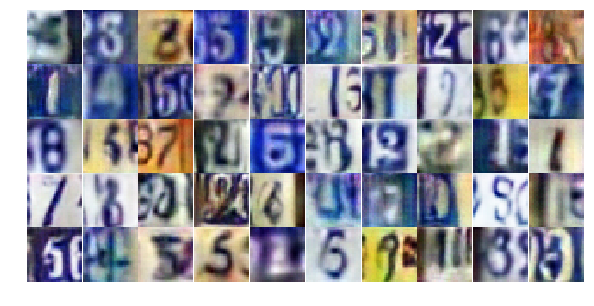

Epoch 23/25 Batch 44/572... Discriminator Loss: 0.6107... Generator Loss: 1.1710
Epoch 23/25 Batch 94/572... Discriminator Loss: 0.5816... Generator Loss: 1.5200
Epoch 23/25 Batch 144/572... Discriminator Loss: 0.5003... Generator Loss: 1.2820
Epoch 23/25 Batch 194/572... Discriminator Loss: 0.8294... Generator Loss: 1.1273
Epoch 23/25 Batch 244/572... Discriminator Loss: 0.5749... Generator Loss: 1.4257
Epoch 23/25 Batch 294/572... Discriminator Loss: 1.1096... Generator Loss: 0.7532


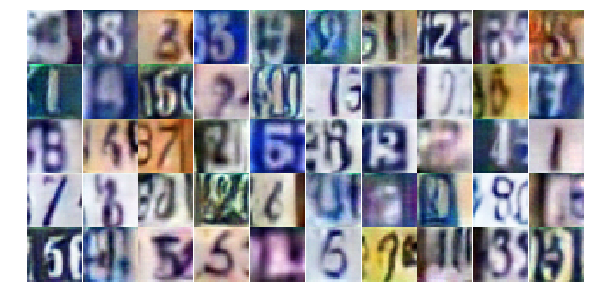

Epoch 23/25 Batch 344/572... Discriminator Loss: 0.8418... Generator Loss: 0.9910
Epoch 23/25 Batch 394/572... Discriminator Loss: 0.7024... Generator Loss: 0.9763
Epoch 23/25 Batch 444/572... Discriminator Loss: 0.8709... Generator Loss: 1.4826
Epoch 23/25 Batch 494/572... Discriminator Loss: 1.0090... Generator Loss: 0.7026
Epoch 23/25 Batch 544/572... Discriminator Loss: 1.3934... Generator Loss: 0.4038
Epoch 24/25 Batch 21/572... Discriminator Loss: 0.8380... Generator Loss: 0.9150


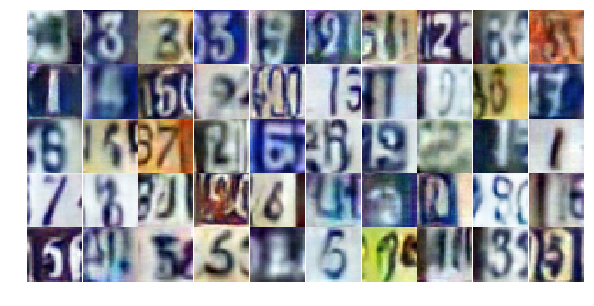

Epoch 24/25 Batch 71/572... Discriminator Loss: 0.9002... Generator Loss: 0.7331
Epoch 24/25 Batch 121/572... Discriminator Loss: 0.3705... Generator Loss: 1.7250
Epoch 24/25 Batch 171/572... Discriminator Loss: 0.9539... Generator Loss: 1.5069
Epoch 24/25 Batch 221/572... Discriminator Loss: 0.8012... Generator Loss: 0.9676
Epoch 24/25 Batch 271/572... Discriminator Loss: 0.6404... Generator Loss: 1.1733
Epoch 24/25 Batch 321/572... Discriminator Loss: 0.6354... Generator Loss: 1.5498


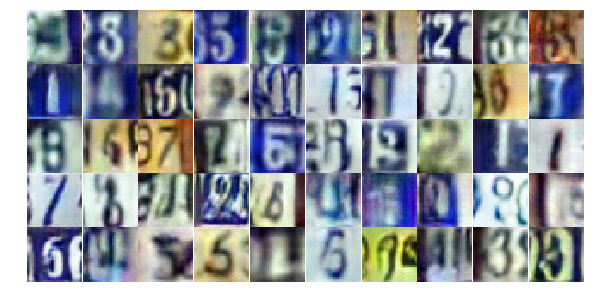

Epoch 24/25 Batch 371/572... Discriminator Loss: 0.8875... Generator Loss: 0.8459
Epoch 24/25 Batch 421/572... Discriminator Loss: 0.5971... Generator Loss: 1.8255
Epoch 24/25 Batch 471/572... Discriminator Loss: 1.4621... Generator Loss: 0.3576
Epoch 24/25 Batch 521/572... Discriminator Loss: 1.4148... Generator Loss: 2.9783
Epoch 24/25 Batch 571/572... Discriminator Loss: 1.0332... Generator Loss: 0.7049
Epoch 25/25 Batch 48/572... Discriminator Loss: 0.8938... Generator Loss: 0.8107


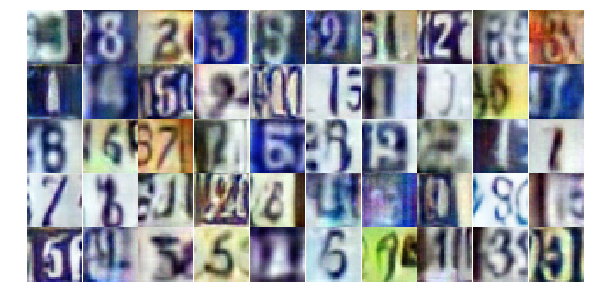

Epoch 25/25 Batch 98/572... Discriminator Loss: 0.8075... Generator Loss: 1.8667
Epoch 25/25 Batch 148/572... Discriminator Loss: 1.0741... Generator Loss: 0.6734
Epoch 25/25 Batch 198/572... Discriminator Loss: 0.9885... Generator Loss: 0.6923
Epoch 25/25 Batch 248/572... Discriminator Loss: 1.0801... Generator Loss: 0.6129
Epoch 25/25 Batch 298/572... Discriminator Loss: 1.6964... Generator Loss: 0.3278
Epoch 25/25 Batch 348/572... Discriminator Loss: 0.8673... Generator Loss: 0.8878


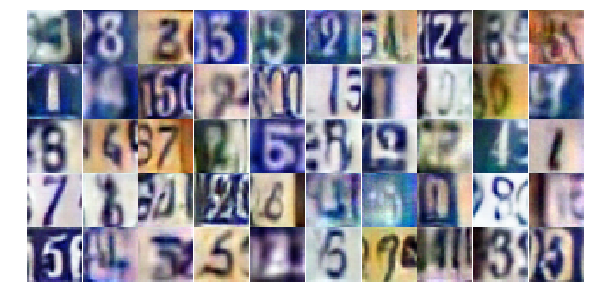

Epoch 25/25 Batch 398/572... Discriminator Loss: 1.2337... Generator Loss: 0.5205
Epoch 25/25 Batch 448/572... Discriminator Loss: 0.6652... Generator Loss: 1.0112
Epoch 25/25 Batch 498/572... Discriminator Loss: 0.7491... Generator Loss: 1.2561
Epoch 25/25 Batch 548/572... Discriminator Loss: 1.0793... Generator Loss: 0.5701


In [42]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5), print_every=50, show_every=300)

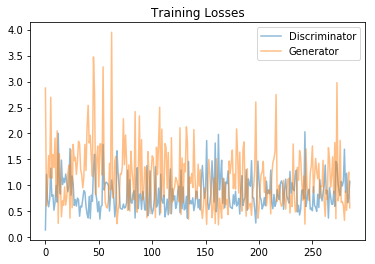

In [43]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

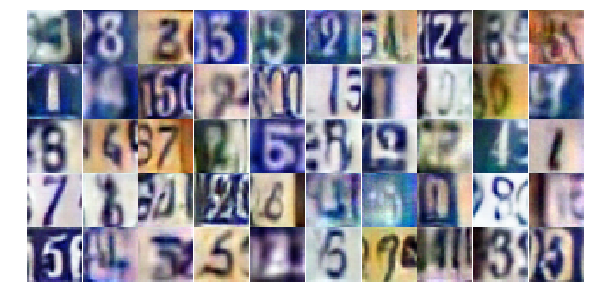

In [44]:
_ = view_samples(-1, samples, 5, 10, figsize=(10,5))